In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/deeplearning-manar-spider/radiological_gradings.csv
/kaggle/input/deeplearning-manar-spider/overview.csv
/kaggle/input/deeplearning-manar-spider/images/images/239_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/214_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/185_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/147_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/234_t2_SPACE.mha
/kaggle/input/deeplearning-manar-spider/images/images/73_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/48_t1.mha
/kaggle/input/deeplearning-manar-spider/images/images/33_t1.mha
/kaggle/input/deeplearning-manar-spider/images/images/184_t1.mha
/kaggle/input/deeplearning-manar-spider/images/images/50_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/13_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/215_t2.mha
/kaggle/input/deeplearning-manar-spider/images/images/41_t2_SPACE.mha
/kaggle/input/deeplearning-man

## Dataset

### Loading

#Terminal Commands<br>
!wget https://zenodo.org/records/10159290/files/images.zip?download=1<br>
!wget https://zenodo.org/records/10159290/files/masks.zip?download=1<br>
!unzip /kaggle/working/masks.zip?download=1<br>
!unzip /kaggle/working/images.zip?download=1<br>

### Exploration

In [5]:
# Libraries
import torch
import cv2
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

In [11]:
!pip install medpy

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.2/156.2 kB 2.7 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for medpy: filename=MedPy-0.5.1-py3-none-any.whl size=224731 sha256=c667a78c95b9c0f0835672d6b56bf80a2b749c149972a0e7d0d5aa803290c761
  Stored in directory: /root/.cache/pip/wheels/e6/8f/f9/7fec657d34ad3ebd2ea3ca5ad0e526f8fea93c3fb4a26c3416
Successfully built medpy


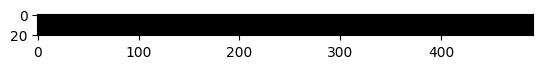

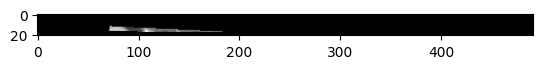

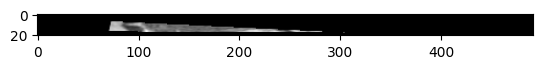

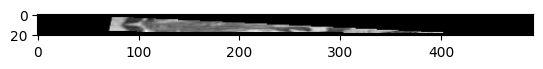

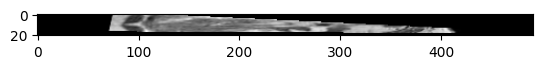

...

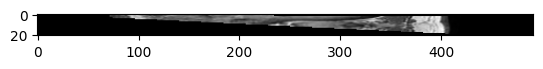

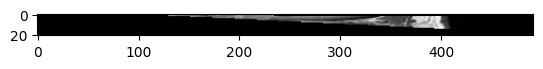

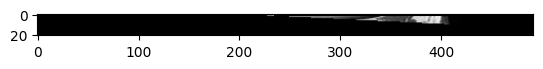

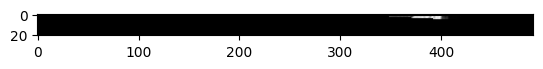

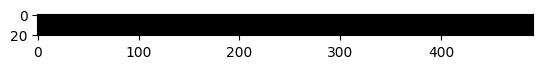

In [30]:
import matplotlib.pyplot as plt
from medpy.io import load

def visualize_mha(filepath):
    """
    Loads an *.mha image and displays all slices as static images.

    Args:
    filepath: Path to the *.mha image file.
    """
    # Load the image and header data
    image_data, image_header = load(filepath)

    # Check if data has more than 2 dimensions (single slice or 3D volume)
    if len(image_data.shape) <= 2:
        raise ValueError("Selected file appears to be less than 2D (single slice or volume expected).")

    # Loop through slices and display them
    for i in range(image_data.shape[2]):
        plt.imshow(image_data[:,:,i], cmap='gray')
#         plt.title(f"Slice {i+1} of {image_data.shape[2]}")
        plt.show()
    
    fig, axes = plt.subplots(3, 4, figsize=(10, 6))  # Adjust the grid size as needed

for i in range(3):
    for j in range(4):
        slice_idx = i * 4 + j
        if slice_idx < data.shape[2]:
            axes[i, j].imshow(data[:, :, slice_idx], cmap='gray')
            axes[i, j].set_title(f"Slice {slice_idx+1}")
        else:
            axes[i, j].axis('off')  # Hide empty subplots

plt.tight_layout()
plt.show()


# Example usage
filepath = "/kaggle/input/deeplearning-manar-spider/images/images/100_t1.mha"  # Replace with your actual file path
visualize_mha(filepath)


In [ ]:
import matplotlib.pyplot as plt
from medpy.io import load
import numpy as np


def visualize_mha_grid(filepath, grid_shape=(3, 4)):
    """
    Loads an *.mha image and displays all slices in a grid of subplots.

    Args:
    filepath: Path to the *.mha image file.
    grid_shape: A tuple representing the number of rows and columns in the subplot grid.
    """
    # Load the image and header data
    image_data, image_header = load(filepath)

    # Check if data has more than 2 dimensions (single slice or 3D volume)
    if len(image_data.shape) <= 2:
    raise ValueError("Selected file appears to be less than 2D (single slice or volume expected).")

    # Calculate total number of slices and grid dimensions based on input
    num_slices = image_data.shape[2]
    rows, cols = grid_shape

    # Handle cases where total slices don't fill the grid completely
    if num_slices < rows * cols:
    rows = min(rows, (num_slices + cols - 1) // cols)  # Adjust rows to fit all slices

    # Create the figure and subplots based on grid shape
    fig, axes = plt.subplots(rows, cols, figsize=(12, (rows * 3)))  # Adjust figsize as needed

    # Loop through slices and display them in the grid
    for i in range(rows):
    for j in range(cols):
      slice_idx = i * cols + j
      if slice_idx < num_slices:
        axes[i, j].imshow(image_data[:, :, slice_idx], cmap='gray')
        axes[i, j].set_title(f"Slice {slice_idx+1}")
      else:
        axes[i, j].axis('off')  # Hide empty subplots

  plt.tight_layout()
  plt.show()


# Example usage
filepath = "/kaggle/input/deeplearning-manar-spider/images/images/100_t1.mha"  # Replace with your actual file path
visualize_mha_grid(filepath)


CalledProcessError: Command '['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '640x480', '-pix_fmt', 'rgba', '-r', '10.0', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', 'mha_animation.mp4']' returned non-zero exit status 255.

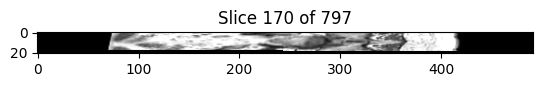

In [25]:
import matplotlib.pyplot as plt
from medpy.io import load
import matplotlib.animation as animation
from IPython.display import HTML

def visualize_mha(filepath, output_filename="mha_animation.mp4"):
    """
    Loads an *.mha image, creates an animation, and saves it as a video.

    Args:
    filepath: Path to the *.mha image file.
    output_filename: Name of the output video file (optional).
    """
    # Load the image and header data
    image_data, image_header = load(filepath)

    # Check if data has more than 2 dimensions (single slice or 3D volume)
    if len(image_data.shape) <= 2:
        raise ValueError("Selected file appears to be less than 2D (single slice or volume expected).")

    # Function to update the slice displayed in the animation
    def update_slice(num):
        plt.imshow(image_data[:,:,num], cmap='gray')
        plt.title(f"Slice {num+1} of {image_data.shape[2]}")

    # Create the animation figure
    fig, ax = plt.subplots()

    # Animate using FuncAnimation, updating slice number on each frame
    anim = animation.FuncAnimation(fig, update_slice, frames=image_data.shape[2], interval=100)

    # Save animation as video
    anim.save(output_filename, writer='ffmpeg')

    # Display the video in the notebook (assuming output filename is correct)
    display(HTML(f"<video width='400' controls><source src='{output_filename}' type='video/mp4'></video>"))

# Example usage
filepath = "/kaggle/input/deeplearning-manar-spider/images/images/100_t1.mha"  # Replace with your actual file path
visualize_mha(filepath)


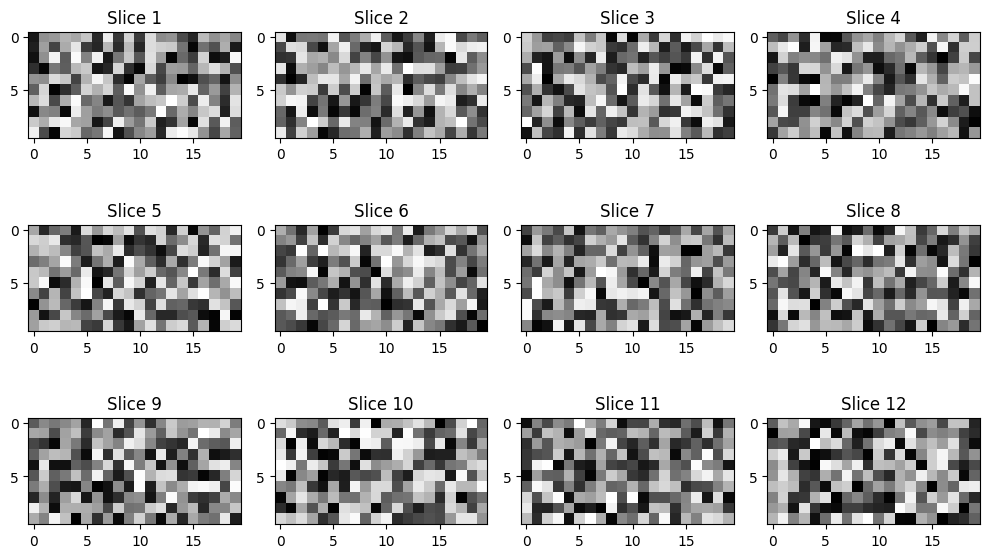

In [46]:
import matplotlib.pyplot as plt
import numpy as np


# Sample 3D data (replace with your actual data loading logic)
data = np.random.rand(10, 20, 30)  # Adjust the shape as needed

# Collect slices into a single frame
fig, axes = plt.subplots(3, 4, figsize=(10, 6))  # Adjust the grid size as needed

for i in range(3):
    for j in range(4):
        slice_idx = i * 4 + j
        if slice_idx < data.shape[2]:
            axes[i, j].imshow(data[:, :, slice_idx], cmap='gray')
            axes[i, j].set_title(f"Slice {slice_idx+1}")
        else:
            axes[i, j].axis('off')  # Hide empty subplots

plt.tight_layout()
plt.show()


In [3]:
IMG_DIR = '/kaggle/input/deeplearning-manar-spider/images/images'
MASK_DIR = '/kaggle/input/deeplearning-manar-spider/masks'

In [48]:
!pip install SimpleITK matplotlib

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


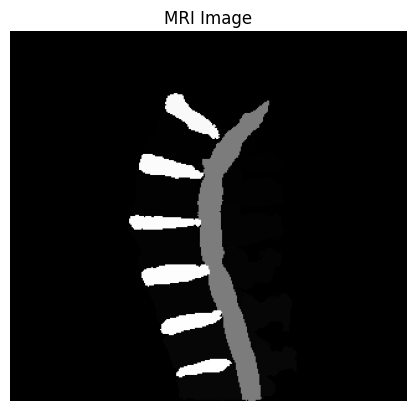

In [59]:
# Code for viewing the image 
import SimpleITK as sitk
import matplotlib.pyplot as plt

image_path = "/kaggle/input/deeplearning-manar-spider/masks/masks/101_t1.mha"
image = sitk.ReadImage(image_path)


image_array = sitk.GetArrayFromImage(image)


if image.GetDimension() == 3:  # Check if it's a 3D image
    caster = sitk.MaximumProjectionImageFilter()
#     caster.SetInterpolator(sitk.sitkLinear)  # Choose an interpolator (optional)
    image = caster.Execute(image)  # Create the MIP





image_array = sitk.GetArrayFromImage(image)

plt.imshow(image_array, cmap='gray')  # Adjust cmap for RGB (if applicable)
plt.title('MRI Image')
plt.axis('off')
plt.show()